# Load Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from pathlib import Path
from PIL import Image
Image.MAX_IMAGE_PIXELS = 1000000000 
from PIL import Image, ImageOps
from os import listdir
from os.path import isfile, join
import sys
from tysserand import tysserand as ty

import seaborn as sns
from time import time
import copy
from skimage import color
import matplotlib as mpl
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_validate, GridSearchCV, RandomizedSearchCV
from scipy.stats import loguniform
from sklearn.cluster import OPTICS, cluster_optics_dbscan
from skimage import io
from scipy.stats import ttest_ind, mannwhitneyu, ks_2samp 
import glob
import os
from datetime import datetime


#### Load Local Libs (src)

In [2]:
import sys; sys.path.insert(0, '../src/')
import mosna
import SpatialFeature

2022-12-08 11:35:09.209219: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:
2022-12-08 11:35:09.209236: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


### Set-up data dirs

In [9]:
import os
dataset1_path = Path('../data/raw/IMMUCan_example/coords/')

In [5]:
%load_ext rpy2.ipython

### Read coordinates

In [69]:
coords = pd.DataFrame()
for filename in os.listdir(dataset1_path):
    coord = pd.read_csv(dataset1_path / filename, usecols=[4,5,18,16]  )
    coord.columns = ['x','y','sample','variable']
    coords = pd.concat([coords,coord],axis=0)
coords

,x,y,sample,variable
0,283.815789,0.947368,NSCLC_10068868_005,Tumor
1,445.222222,0.722222,NSCLC_10068868_005,Tumor
2,460.043478,0.565217,NSCLC_10068868_005,CD38
3,522.800000,0.850000,NSCLC_10068868_005,Tumor
4,538.654545,1.581818,NSCLC_10068868_005,Tumor
...,...,...,...,...
8118,217.120000,597.300000,BCC_10067433_004,BnCD4
8119,14.578947,597.578947,BCC_10067433_004,BnCD8
8120,357.555556,597.722222,BCC_10067433_004,Macrophage
8121,107.918033,592.327869,BCC_10067433_004,HLADR


In [70]:
coords['sample'] = coords['sample'].str.split('_',expand=True)[0].values + coords['sample'].str.split('_',expand=True)[1].values
coords.head()

,x,y,sample,variable
0,283.815789,0.947368,NSCLC10068868,Tumor
1,445.222222,0.722222,NSCLC10068868,Tumor
2,460.043478,0.565217,NSCLC10068868,CD38
3,522.800000,0.850000,NSCLC10068868,Tumor
4,538.654545,1.581818,NSCLC10068868,Tumor


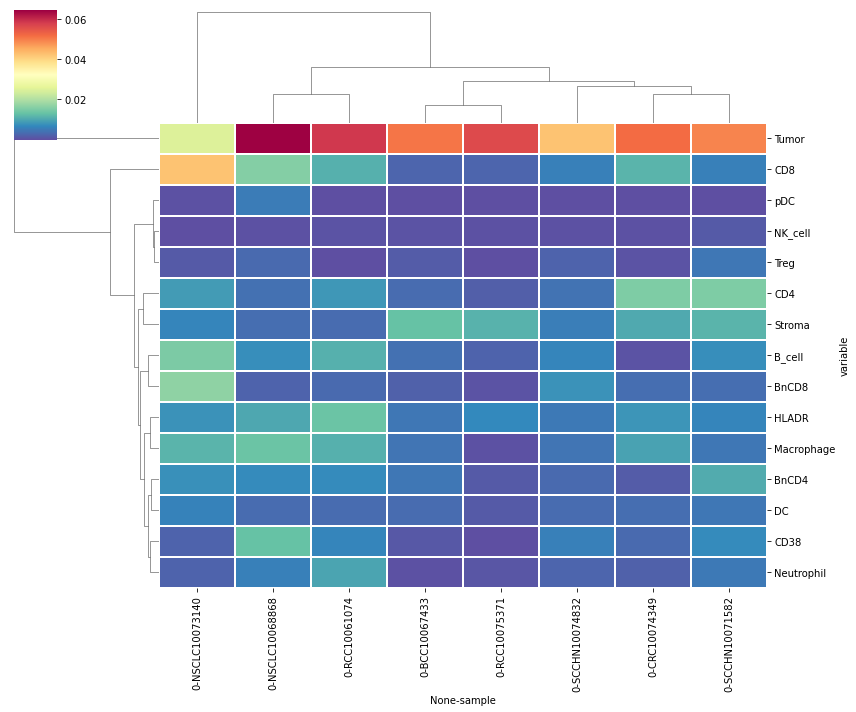

In [79]:
Cell_count = coords[['variable','sample']].value_counts(normalize=True).reset_index()
Cell_count = pd.pivot_table(Cell_count, index = 'variable',columns=['sample']).fillna(0)

sns.clustermap(Cell_count, cmap='Spectral_r',figsize=[12,10],lw=2, method='complete')

In [ ]:
Count = Cell_count.T.reset_index()
Count.index = Count['sample'].str[-8:]
Count = Count.iloc[:,2:]
Count_norm = Count.apply(lambda row: row - Count.min(axis=1), axis=0).div( (Count.max(axis=1) - Count.min(axis=1) ), axis=0)
sns.clustermap(Count_norm, figsize=[25,6], cmap='Spectral_r')


### Network

1


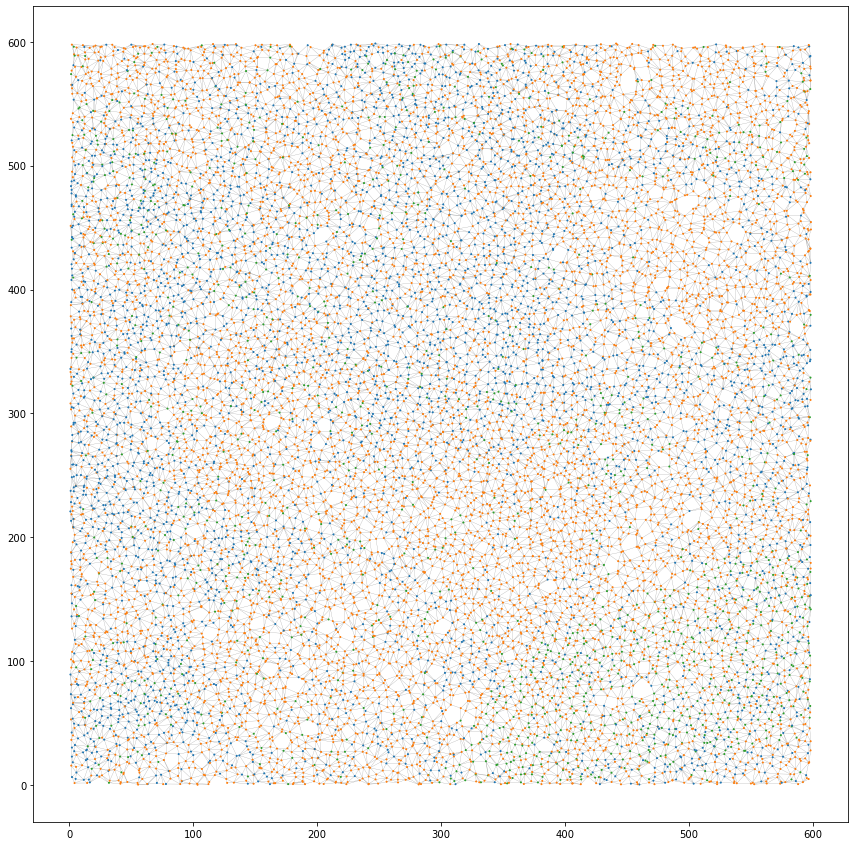

/home/mounim/anaconda3/lib/python3.9/site-packages/distributed/node.py:180: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 39143 instead
  warnings.warn(
2022-12-09 17:28:37.829191: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:/home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:
2022-12-09 17:28:37.829208: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-12-09 17:28:37.831496: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_

2
3


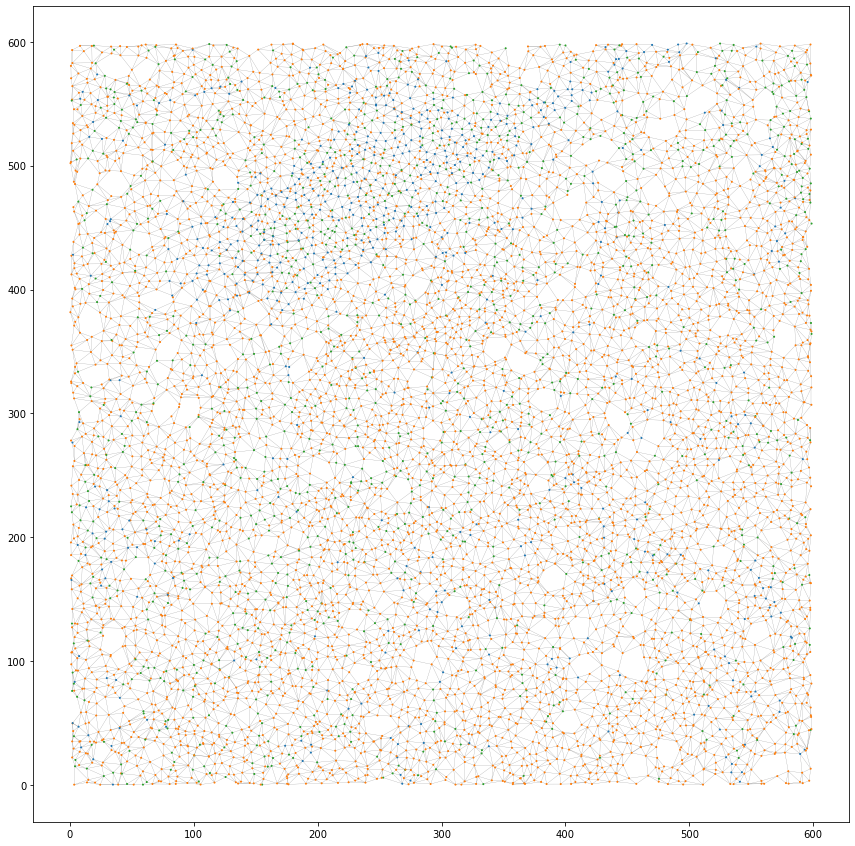

/home/mounim/anaconda3/lib/python3.9/site-packages/distributed/node.py:180: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 41753 instead
  warnings.warn(
2022-12-09 17:29:03.683811: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:/home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:
2022-12-09 17:29:03.683828: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-12-09 17:29:03.786135: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_

4
5


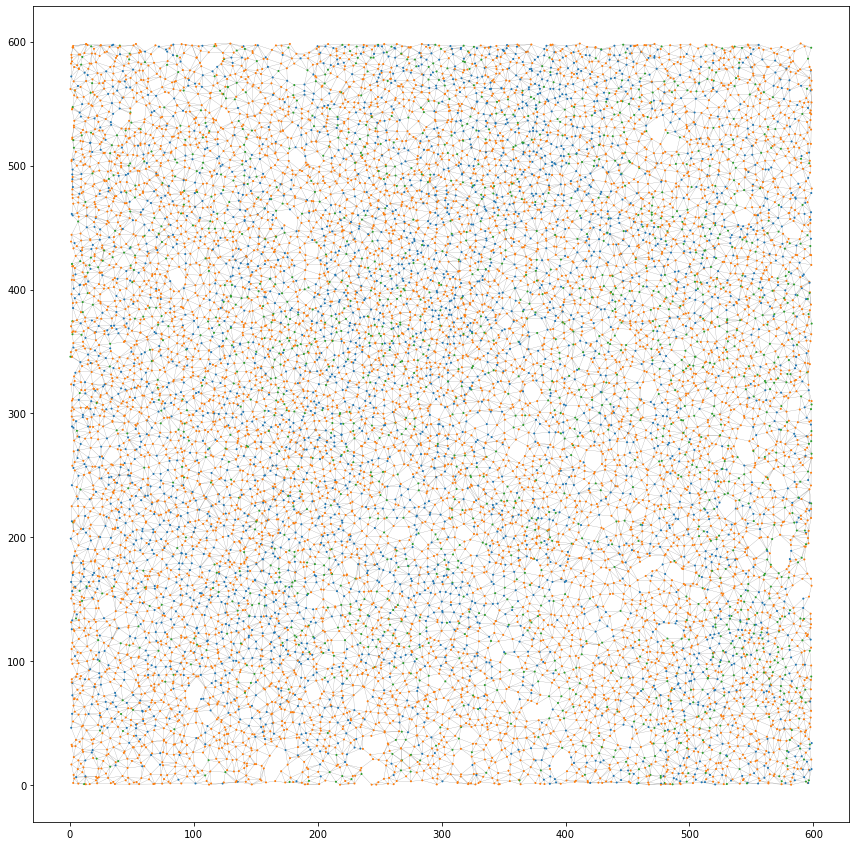

/home/mounim/anaconda3/lib/python3.9/site-packages/distributed/node.py:180: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 46841 instead
  warnings.warn(
2022-12-09 17:29:39.932976: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:/home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:
2022-12-09 17:29:39.932976: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:/home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:
2022-12-0

6
7


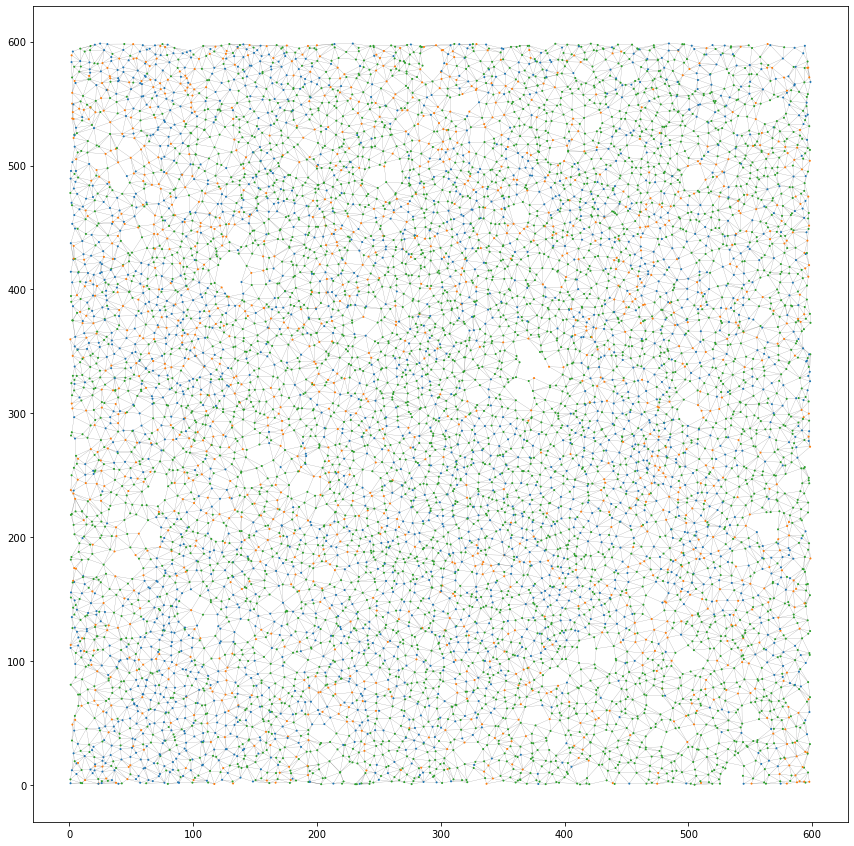

/home/mounim/anaconda3/lib/python3.9/site-packages/distributed/node.py:180: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 40087 instead
  warnings.warn(
2022-12-09 17:30:08.439420: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:/home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:
2022-12-09 17:30:08.439435: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-12-09 17:30:08.444803: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_

8
9


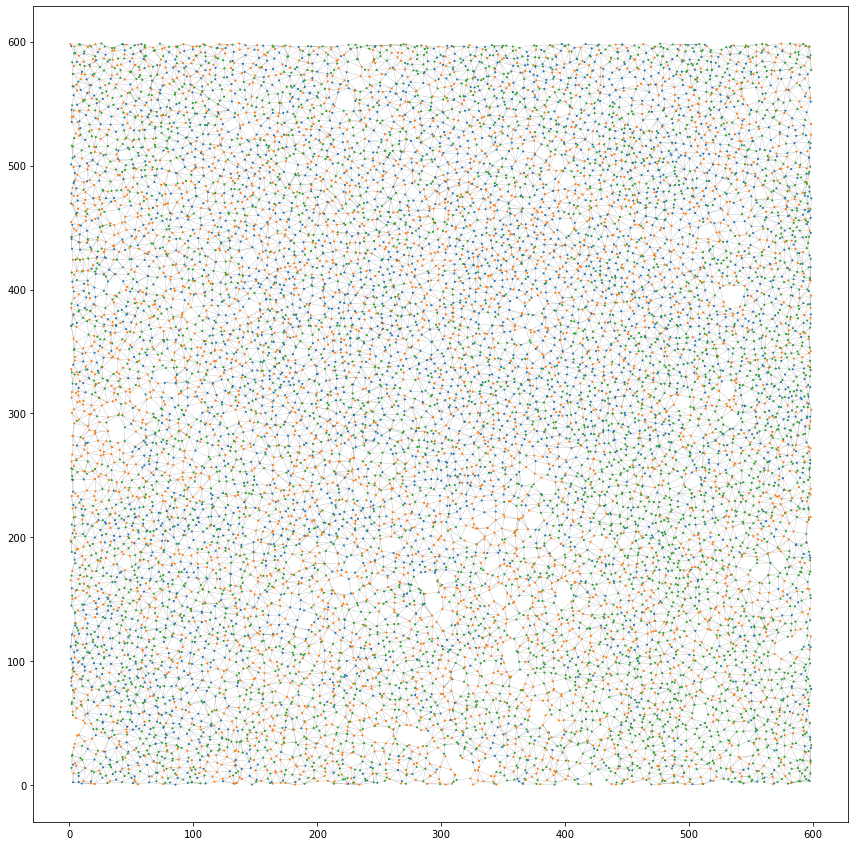

/home/mounim/anaconda3/lib/python3.9/site-packages/distributed/node.py:180: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 36857 instead
  warnings.warn(
2022-12-09 17:30:46.943227: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:/home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:
2022-12-09 17:30:46.943243: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-12-09 17:30:47.011551: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_

10
11


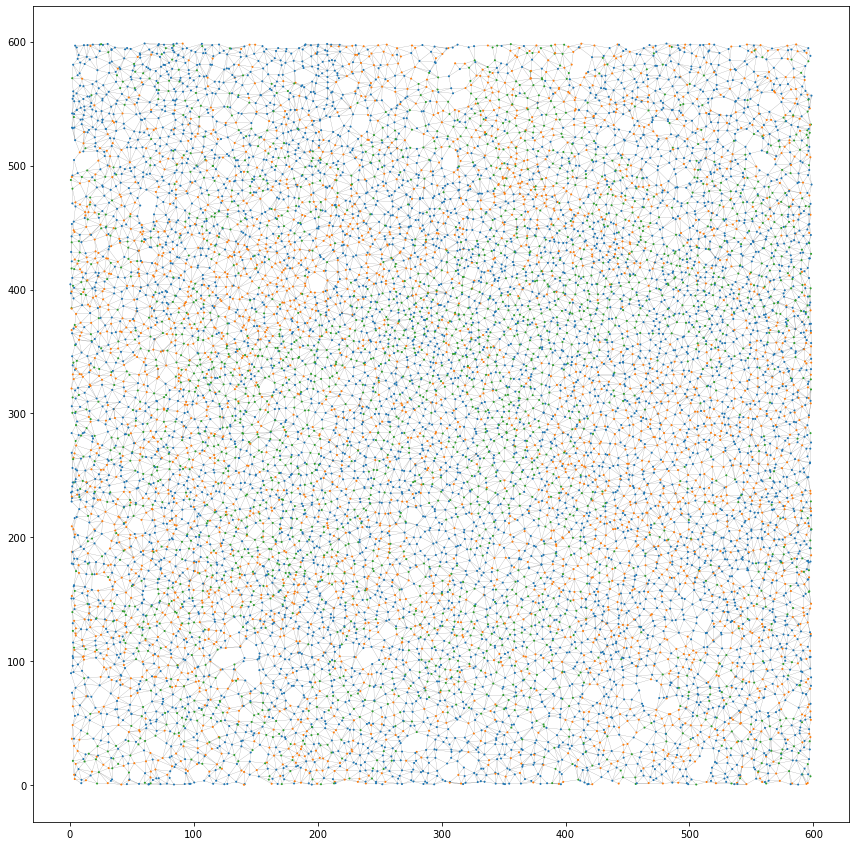

/home/mounim/anaconda3/lib/python3.9/site-packages/distributed/node.py:180: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 44759 instead
  warnings.warn(
2022-12-09 17:31:22.791408: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:/home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:
2022-12-09 17:31:22.791409: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:/home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:
2022-12-0

12
13


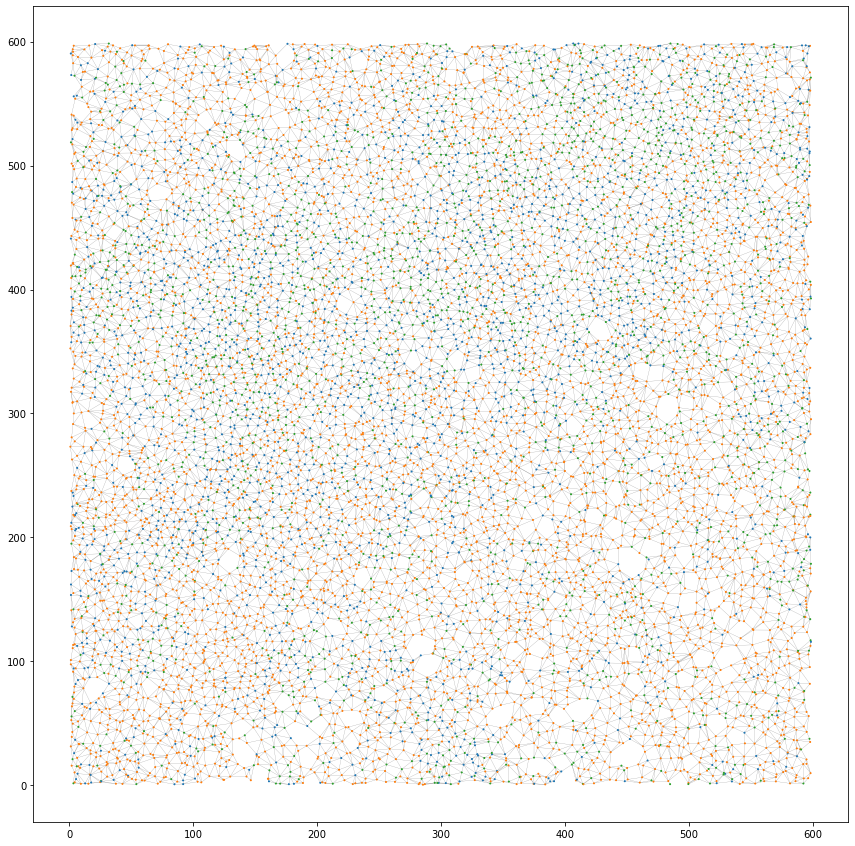

/home/mounim/anaconda3/lib/python3.9/site-packages/distributed/node.py:180: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 44883 instead
  warnings.warn(
2022-12-09 17:31:55.770627: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:/home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:
2022-12-09 17:31:55.770643: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-12-09 17:31:55.816435: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_

14
15


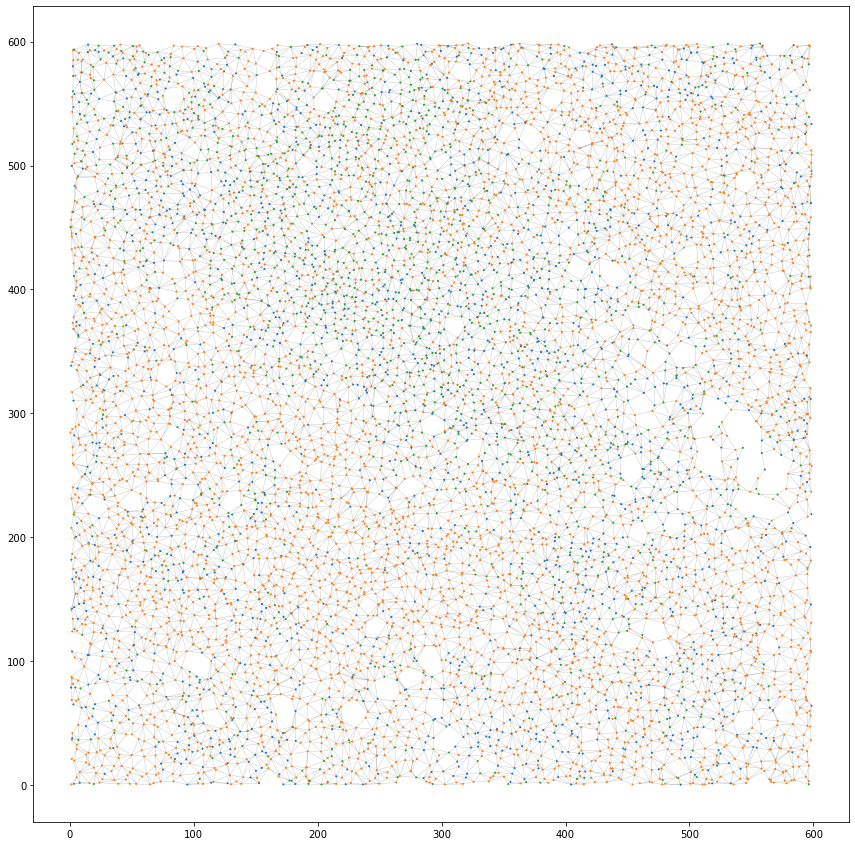

/home/mounim/anaconda3/lib/python3.9/site-packages/distributed/node.py:180: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 39937 instead
  warnings.warn(
2022-12-09 17:32:23.632477: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:/home/mounim/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:
2022-12-09 17:32:23.632495: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-12-09 17:32:23.682448: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_

16


/home/mounim/CRCT-Projects/Spatial_MultiOmic_Features Pipeline/example/../src/mosna.py:419: RuntimeWarning: divide by zero encountered in true_divide
  zscore = (mat - rand_mean) / rand_std
/home/mounim/CRCT-Projects/Spatial_MultiOmic_Features Pipeline/example/../src/mosna.py:419: RuntimeWarning: invalid value encountered in true_divide
  zscore = (mat - rand_mean) / rand_std


In [105]:
from glob import glob
figsize = (15, 15)
# explore dirs and get coords
c=0
edges_path = Path('../data/processed/dataset_1/edges/')
nodes_path = Path('../data/processed/dataset_1/nodes/')
mixmat_path = Path('../data/processed/dataset_1/mixmat/')
zscores_path = Path('../data/processed/dataset_1/zscores/')
N_SHUFFLE = 10

for filename in  os.listdir(dataset1_path):
    id = filename.split('.')[0]
    coords = pd.read_csv(dataset1_path / filename, usecols=[4,5,18])
    coords.columns = ['x','y','variable']
    coords['sample'] = id
    nodes = coords
    coords = nodes.loc[:,['x','y']].values
    pairs = ty.build_delaunay(coords)
    edges = pd.DataFrame(data=pairs, columns=['source', 'target'])
    edges.to_csv(edges_path / id )
    nodes.to_csv(nodes_path / id )
    c+=1
    print(c) 
    fig, ax = plt.subplots(figsize=[15,15])
    # make colors for nodes
    #                 orange      blue      green
    class_colors = ['#ff7f0e', '#1f77b4', '#2ca02c','#ff7f0e', '#1f77b4', '#2ca02c','#ff7f0e', '#1f77b4', '#2ca02c','#ff7f0e', '#1f77b4', '#2ca02c','#ff7f0e', '#1f77b4', '#2ca02c','#ff7f0e', '#1f77b4', '#2ca02c']
    classes = list(nodes['variable'].unique())
    dico_col = {classes[0]:class_colors[0],
                classes[1]:class_colors[1],
                classes[2]:class_colors[2],
                classes[3]:class_colors[3],
                classes[4]:class_colors[4],
                classes[5]:class_colors[5],
                classes[6]:class_colors[6],
                classes[7]:class_colors[7],
                classes[8]:class_colors[8],
                classes[9]:class_colors[9],
                classes[10]:class_colors[10],
                classes[11]:class_colors[11],
                classes[12]:class_colors[12],
                classes[13]:class_colors[13],
                classes[14]:class_colors[14]}
    colors = []
    for cl in nodes['variable']:
        colors.append(dico_col[cl])
        
    # superimpose network to mIF image
    ty.plot_network(coords, pairs, col_nodes=colors, col_edges='k',size_nodes=1, ax=ax, linewidth=0.2)

    plt.show()



    #mosna data prep
    nodes = nodes[['x', 'y','variable']]
    nodes.columns = ['x', 'y','class']
    attributes = nodes['class']
    #mosna data prep
    mosna_nodes = nodes[['x', 'y']]
    mosna_nodes['Group'] = attributes.values
    mosna_nodes = mosna_nodes.join(pd.get_dummies(mosna_nodes['Group']))
    attributes = nodes['class']
    nodes['Group'] = attributes.values
    nodes = nodes.join(pd.get_dummies(nodes['Group']))
    att = nodes['Group']
    attributes = nodes['Group'].unique()

    
    mixmat = mosna.mixing_matrix(nodes, edges, attributes)
    assort = mosna.attribute_ac(mixmat)
    n_cells = mosna_nodes.shape[0]

    mixmat_rand, assort_rand = mosna.randomized_mixmat(nodes, edges, attributes, n_shuffle=N_SHUFFLE, parallel=5)
    mixmat_mean, mixmat_std, mixmat_zscore = mosna.zscore(mixmat, mixmat_rand, return_stats=True)
    assort_mean, assort_std, assort_zscore = mosna.zscore(assort, assort_rand, return_stats=True)
    mixmat = mosna.mixmat_to_df(mixmat, attributes)
    mixmat.to_csv(mixmat_path / str(id) )
    mixmat_zscore = mosna.mixmat_to_df(mixmat_zscore, attributes)
    mixmat_zscore = mixmat_zscore.fillna(0)
    mixmat_zscore.to_csv(zscores_path / str(id) )

    c+=1
    print(c) 


       X      Y     Value           comb    sample
0  Tumor   CD38  1.430815   Tumor / CD38  10061074
1  Tumor   Treg  0.166155   Tumor / Treg  10061074
2  Tumor    CD4 -2.056704    Tumor / CD4  10061074
3  Tumor  HLADR -1.677590  Tumor / HLADR  10061074
4  Tumor    CD8  1.445033    Tumor / CD8  10061074


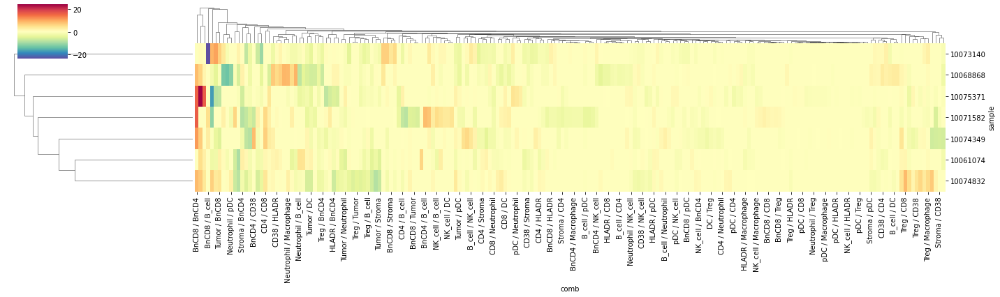

In [153]:
files = [file for file in os.listdir(zscores_path)]

zscores = pd.DataFrame()
mixings = pd.DataFrame()
for filename in files:
    id = filename
    mixmat_zscore = pd.read_csv(zscores_path / filename ,index_col=0 ) #read file
    zscore_tri = mixmat_zscore.where(np.triu(np.ones(mixmat_zscore.shape), k = 1).astype(np.bool_) )
    MAT = pd.DataFrame(zscore_tri.stack()) # matrix to df (melt)
    MAT.to_csv( 'tmp.csv') #export csv
    MAT = pd.read_csv( 'tmp.csv') # read csv
    MAT.columns = ['X','Y','Value'] # rename cols
    MAT["comb"] = MAT["X"].astype(str) + " / " + MAT["Y"].astype(str)
    MAT['sample']  = id
    if zscores.shape[0] > 0:
        if id in zscores['sample']:
            zscores.merge(MAT, left_on='sample', right_on='sample')
        else:
            zscores = pd.concat([zscores , pd.DataFrame(MAT)] , axis = 0)
    else:
        zscores = pd.concat([zscores , pd.DataFrame(MAT)] , axis = 0)

print(zscores.head())



#end of layer
mixings = zscores[['Value', 'comb', 'sample']]
# mixings.to_csv( mixings__path / (layer + 'mixings.csv' ) )

#select specific columns (Remove other)
columns = list(set(mixings['comb'].tolist()))
mixings_filtred = mixings[ mixings['comb'].isin( columns ) ]

##remove comparaison of type to itself


#Df to Matrix
mixings_filtred = mixings_filtred.pivot_table(index=["sample"], 
                    columns='comb', 
                    values='Value', 
                    fill_value=0)

markers_combo = mixings_filtred.columns

mixings_filtred.replace([np.inf, -np.inf], np.nan, inplace=True)

mixings_nNA = mixings_filtred.dropna(axis=0,how='any').dropna(axis=1,how='any')
sns.clustermap(mixings_nNA, figsize=[20,6], cmap='Spectral_r')

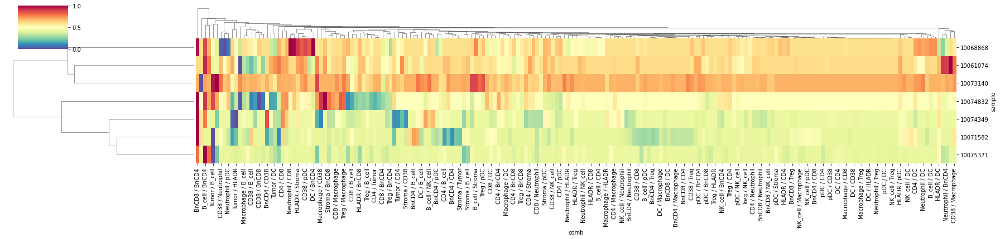

In [168]:
mixings_patient_norm = mixings_nNA.apply(lambda row: row - mixings_nNA.min(axis=1), axis=0).div( (mixings_nNA.max(axis=1) - mixings_nNA.min(axis=1) ), axis=0)
sns.clustermap(mixings_patient_norm, figsize=[25,6], cmap='Spectral_r')

## NAS

In [217]:
from importlib import reload
import SpatialFeature as SF
reload(SpatialFeature)


In [ ]:
coords = pd.DataFrame()
for filename in os.listdir(dataset1_path):
    coord = pd.read_csv(dataset1_path / filename, usecols=[4,5,18,16]  )
    coord.columns = ['x','y','sample','variable']
    coords = pd.concat([coords,coord],axis=0)

In [321]:
coords = pd.DataFrame()
for filename in os.listdir(dataset1_path):
    coord = pd.read_csv(dataset1_path / filename, usecols=[4,5,18,16]  )
    coord.columns = ['x','y','sample','variable']
    coords = pd.concat([coords,coord],axis=0)
coords['sample'] = coords['sample'].str[-12:-4]
coords.sample(5)

,x,y,sample,variable
7670,150.326923,275.442308,10068868,Tumor
4968,64.500000,401.285714,10067433,HLADR
1736,305.690909,355.418182,10071582,Treg
5396,101.672316,241.717514,10074349,Tumor
1391,67.033333,281.083333,10071582,CD4


In [261]:
edges_all = pd.DataFrame()
for filename in os.listdir(edges_path):
    edge = pd.read_csv(edges_path / filename, index_col=0  )
    edge['sample'] = filename
    edges_all = pd.concat([edges_all,edge],axis=0,ignore_index=True)
edges_all.head()

,source,target,sample
0,3166,9539,10061074
1,3166,12243,10061074
2,3166,6805,10061074
3,1591,10691,10061074
4,1591,4827,10061074


In [466]:
NAS = pd.DataFrame()
#for each cell
c = 0
all_coords = coords.copy()
all_edges = edges_all.copy()
for index, row in all_coords.iterrows():
    try:
        sourceIdx = index
        sample = row['sample']
        # get targets from all_edges
        targets_edges = all_edges.loc[(all_edges['source']==sourceIdx) & (all_edges['sample']==sample) , : ]
        targets = list(targets_edges['target'])
        # get sources from all_edges
        source_edges = all_edges.loc[(all_edges['target']==sourceIdx) & (all_edges['sample']==sample) , : ]
        targets += list(targets_edges['source'])
        # select rows
        selected_targets = all_coords.iloc[targets,:]
        # filtre by sample
        selected_targets = selected_targets[selected_targets['sample'] == sample]
        celltypes = selected_targets['variable'].value_counts(normalize=True)
        cell = pd.concat([row,celltypes])
        NAS = pd.concat([NAS, cell],axis=1)
        # Remove processed Idx ?
        #  --- From edges 
        # all_edges = all_edges.drop(targets_edges.index)
        # all_edges = all_edges.drop(source_edges.index)
        #  --- From coords
        # all_coords = all_coords.drop(sourceIdx)
        c+=1
        if c % 1000:
            print(c)
    except:
        print(c)
NAS

9548


distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 36% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 36% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 36% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 36% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 36% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 36% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 36% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 36% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
x,283.815789,445.222222,460.043478,522.8,538.654545,552.75,588.166667,89.5,201.804878,472.230769,...,35.691176,50.887324,256.783784,305.104478,596.555556,217.12,14.578947,357.555556,107.918033,506.214286
y,0.947368,0.722222,0.565217,0.85,1.581818,0.833333,0.888889,0.941176,1.268293,0.846154,...,596.691176,596.464789,596.635135,596.373134,597.074074,597.3,597.578947,597.722222,592.327869,598.214286
sample,10068868,10068868,10068868,10068868,10068868,10068868,10068868,10068868,10068868,10068868,...,10067433,10067433,10067433,10067433,10067433,10067433,10067433,10067433,10067433,10067433
variable,Tumor,Tumor,CD38,Tumor,Tumor,Tumor,Tumor,Tumor,Tumor,Tumor,...,BnCD4,BnCD4,Treg,CD38,Macrophage,BnCD4,BnCD8,Macrophage,HLADR,DC
Tumor,1.0,1.0,NaN,0.875,1.0,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CD8,NaN,NaN,NaN,0.125,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Neutrophil,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
B_cell,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Macrophage,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [468]:
NAS = pd.DataFrame(NAS.T).fillna(0)
NAS.to_csv('../data/nas.csv')
NAS.head()

,x,y,sample,variable,Tumor,CD8,Neutrophil,DC,B_cell,Macrophage,CD4,HLADR,Treg,Stroma,CD38,pDC,BnCD8,NK_cell,BnCD4
0,283.815789,0.947368,10068868,Tumor,1.000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0,445.222222,0.722222,10068868,Tumor,1.000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0,460.043478,0.565217,10068868,CD38,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0,522.800000,0.850000,10068868,Tumor,0.875,0.125,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0,538.654545,1.581818,10068868,Tumor,1.000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [473]:
NAS.head()
X = NAS.iloc[:,4:]
y = NAS.iloc[:,2:4]
y['patient'] = y['sample']
y['Var_Sample'] = y['sample'] + '_' + y['variable']
# pd.DataFrame(y)
VarCounts = y[['Var_Sample','patient']].value_counts()

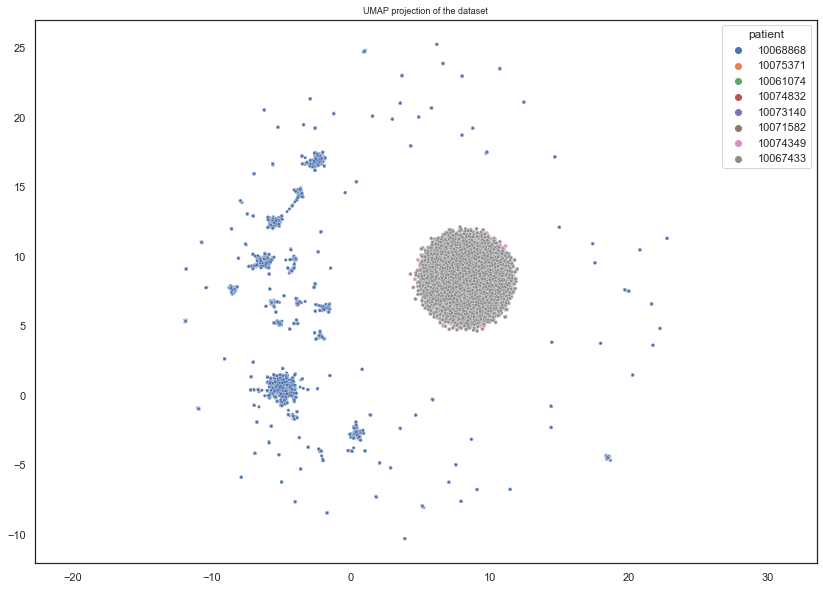

In [476]:
sns.set(style='white', context='notebook', rc={'figure.figsize':(14,10)})

# reducer = umap.UMAP()

embedding = reducer.fit_transform(X)
# embedding = umap.UMAP(n_neighbors=5, random_state=42).fit(X)

sns.scatterplot(
    x = embedding[:, 0],
    y = embedding[:, 1],
    s = 10,
    hue=y['patient']
    )
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the dataset', fontsize=9);

In [485]:
# NAS_md = (NAS.iloc[:,2:].groupby(['sample', 'variable'], as_index=False).median())
NAS_md = (NAS.iloc[:,2:].groupby(['sample'], as_index=False).mean())
NAS_md
# NAS_m = NAS_med.melt(id_vars=['sample','variable'])
# NAS_m

,sample,Tumor,CD8,Neutrophil,DC,B_cell,Macrophage,CD4,HLADR,Treg,Stroma,CD38,pDC,BnCD8,NK_cell,BnCD4
0,10061074,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
1,10067433,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
2,10068868,0.378423,0.094776,0.033272,0.020869,0.043747,0.079334,0.024859,0.059775,0.019879,0.021809,0.079964,0.03144,0.014849,0.002263,0.043619
3,10071582,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
4,10073140,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
5,10074349,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
6,10074832,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
7,10075371,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000


In [355]:
colors

['#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#1f77b4',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#1f77b4',
 '#ff7f0e',
 '#2ca02c',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#1f77b4',
 '#2ca02c',
 '#2ca02c',
 '#2ca02c',
 '#1f77b4',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#2ca02c',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#1f77b4',
 '#ff7f0e',
 '#ff7f0e',
 '#1f77b4',
 '#1f77b4',
 '#2ca02c',
 '#ff7f0e',
 '#2ca02c',
 '#1f77b4',
 '#1f77b4',
 '#ff7f0e',
 '#2ca02c',
 '#2ca02c',
 '#1f77b4',
 '#ff7f0e',
 '#ff7f0e',
 '#1f77b4',
 '#ff7f0e',
 '#ff7f0e',
 '#1f77b4',
 '#ff7f0e',
 '#1f77b4',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#1f77b4',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#2ca02c',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#2ca02c',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#1f77b4',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#1f77b4',
 '#ff7f0e',
 '#ff7f0e',
 '#ff7f0e',
 '#2ca02c',
 '#2ca02c',
 '#1f77b4',
 '#f

### Merge Count and Mixing Matrix

In [335]:
mixings_patient_norm.head()

comb,B_cell / BnCD4,B_cell / BnCD8,B_cell / CD38,B_cell / CD4,B_cell / CD8,B_cell / DC,B_cell / HLADR,B_cell / Macrophage,B_cell / NK_cell,B_cell / Neutrophil,...,pDC / CD38,pDC / CD4,pDC / CD8,pDC / DC,pDC / HLADR,pDC / Macrophage,pDC / NK_cell,pDC / Neutrophil,pDC / Stroma,pDC / Treg
sample,,,,,,,,,,,,,,,,,,,,,
10061074,0.937278,0.775614,0.606826,0.606826,0.606826,0.606826,0.606826,0.606826,0.606826,0.606826,...,0.606826,0.606826,0.606826,0.606826,0.606826,0.606826,0.535129,0.606826,0.606826,0.606826
10068868,0.872102,0.682293,0.596828,0.500065,0.530140,0.740457,0.665398,0.455925,0.615234,0.596828,...,0.596828,0.596828,0.596828,0.596828,0.596828,0.596828,0.583830,0.596828,0.596828,0.596828
10071582,0.413812,0.413812,0.413812,0.413812,0.413812,0.413812,0.413812,0.413812,0.413812,0.413812,...,0.413812,0.413812,0.413812,0.413812,0.413812,0.413812,0.413812,0.413812,0.413812,0.413812
10073140,0.718621,0.691271,0.691271,0.691271,0.691271,0.691271,0.691271,0.691271,0.791290,0.691271,...,0.691271,0.691271,0.691271,0.691271,0.691271,0.691271,0.681562,0.691271,0.688613,0.691271
10074349,0.779823,0.427950,0.433870,0.427950,0.427950,0.427950,0.427950,0.427950,0.624467,0.554801,...,0.451723,0.427950,0.427950,0.427950,0.427950,0.427950,0.427950,0.505457,0.427950,0.427950


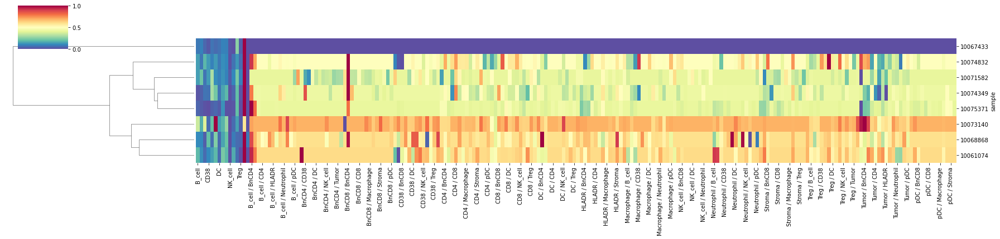

In [200]:
df = pd.concat([Count_norm,mixings_patient_norm],axis=1).fillna(0)
sns.clustermap(df, figsize=[25,6], cmap='Spectral_r', col_cluster=0)
